## Homework Assignment 9

**Question 1:** Select a short video with at least 3 persons and create a new movie from this video with a face tracker (each person’s face needs to be tracked by a rectangle of a different color) (50pt). See, for example, the video in: https://github.com/ageitgey/face_recognition

**Bonus:** Select a video with at least two animals (dog/cat/lion/tiger...), and create a video with an animal tracker (10pt).

In [1]:
!pip install turicreate
!pip uninstall -y tensorflow
!pip install tensorflow-gpu


     |████████████████████████████████| 92.0 MB 15 kB/s 
     |████████████████████████████████| 322 kB 48.4 MB/s 
     |████████████████████████████████| 3.5 MB 50.1 MB/s 
     |████████████████████████████████| 3.6 MB 65.8 MB/s 
     |████████████████████████████████| 86.4 MB 67 kB/s 
     |████████████████████████████████| 18.3 MB 1.2 MB/s 
     |████████████████████████████████| 2.9 MB 64.7 MB/s 
     |████████████████████████████████| 449 kB 60.3 MB/s 
     |████████████████████████████████| 50 kB 9.0 MB/s 
     |████████████████████████████████| 20.1 MB 1.3 MB/s 
     |████████████████████████████████| 3.8 MB 66.6 MB/s 
  Created wheel for prettytable: filename=prettytable-0.7.2-py3-none-any.whl size=13714 sha256=a9d5d33f2d7a8eea7ee8a2b0b7256be4f686c4207a75d28b16f2b28d1e9f862e
  Stored in directory: /root/.cache/pip/wheels/b2/7f/f6/f180315b584f00445045ff1699b550fa895d09471337ce21c6
  Created wheel for resampy: filename=resampy-0.2.1-py3-none-any.whl size=320860 sha256=19509d8a549

Found existing installation: tensorflow 2.0.4
Uninstalling tensorflow-2.0.4:
  Successfully uninstalled tensorflow-2.0.4
     |████████████████████████████████| 489.6 MB 23 kB/s 
     |████████████████████████████████| 5.8 MB 55.1 MB/s 
     |████████████████████████████████| 463 kB 66.5 MB/s 
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.0.1
    Uninstalling tensorflow-estimator-2.0.1:
      Successfully uninstalled tensorflow-estimator-2.0.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.0.2
    Uninstalling tensorboard-2.0.2:
      Successfully uninstalled tensorboard-2.0.2


In [1]:
# Installing the Kaggle package
import json
!pip install kaggle 
!mkdir /root/.kaggle/

#Important Note: complete this with your own key - after running this for the first time remmember to **remove** your API_KEY
api_token ={"username":"amirbialer","key":"f2af62d43f0aaf0ee3bea5998634a1b7"}

# creating kaggle.json file with the personal API-Key details 
# You can also put this file on your Google Drive
with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)
!chmod 600 /root/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle/’: File exists


In [ ]:
!pip install face_recognition

     |████████████████████████████████| 100.1 MB 21 kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566185 sha256=cc436592642f7c7fe08b25f8d87275976110b41f93568b0690192fe4fcfc96f0
  Stored in directory: /root/.cache/pip/wheels/d6/81/3c/884bcd5e1c120ff548d57c2ecc9ebf3281c9a6f7c0e7e7947a
Successfully built face-recognition-models


In [ ]:
from IPython.display import Image
from IPython.core.display import HTML 
from IPython.display import display


In [ ]:
import face_recognition
import cv2
from google.colab.patches import cv2_imshow


In [ ]:
from google.colab import drive
drive.mount("/content/gdrive", force_remount=True)

Mounted at /content/gdrive


In [ ]:

vidcap = cv2.VideoCapture('/content/gdrive/MyDrive/Studying/Big Data/HW_9/Hans Teeuwen Carpool.mp4')
success,image = vidcap.read()
count = 0
while success:
  #cv2.imwrite("frame%d.jpg" % count, image)     # save frame as JPEG file      
  success,image = vidcap.read()
  print('Read a new frame: ', success)
  count += 1

In [ ]:
vidcap = cv2.VideoCapture('/content/gdrive/MyDrive/Studying/Big Data/HW_9/Hans Teeuwen Carpool.mp4')
success,image = vidcap.read()

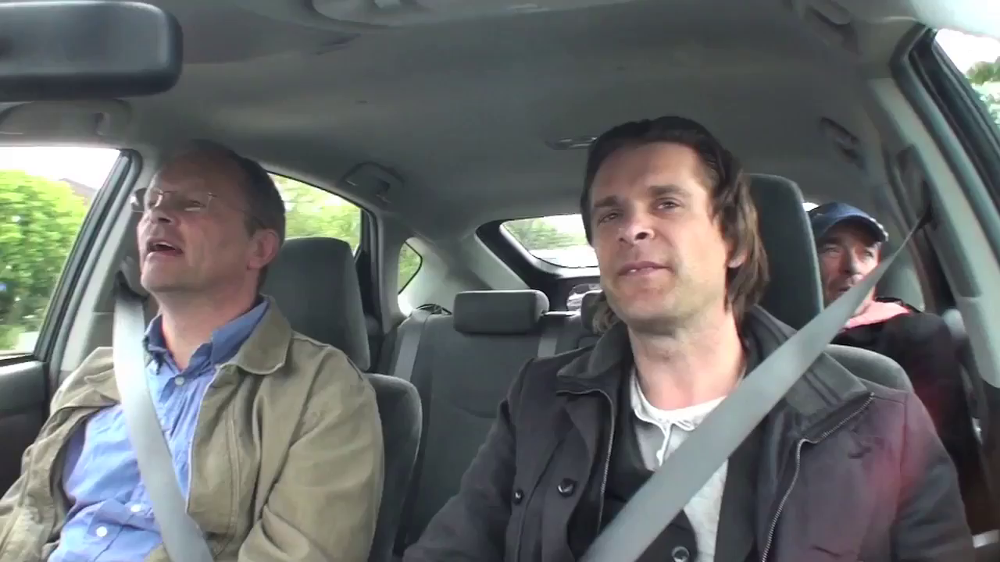

In [ ]:
cv2_imshow(image)

In [ ]:
#faceCascade = cv2.CascadeClassifier("new")
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [ ]:
import matplotlib.pyplot as plt
from IPython.core.display import Image as image
from PIL import Image


In [ ]:
def plot_square_to_image(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  faces = face_cascade.detectMultiScale(
      gray,
      scaleFactor=1.1,
      minNeighbors=5,
      minSize=(30, 30),
      flags = cv2.CASCADE_SCALE_IMAGE
  )
  for (x, y, w, h) in faces:
      cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
  #cv2_imshow(image)
  return image


In [ ]:
vidcap = cv2.VideoCapture('/content/gdrive/MyDrive/Studying/Big Data/HW_9/Hans Teeuwen Carpool.mp4')
success,image = vidcap.read()
c=0

In [ ]:
from tqdm import tqdm
!mkdir ./images
images_path = "./images/"
images_list = []
while success and c<=500:
    if c%24==0:
      image_with_box = plot_square_to_image(image)
      
#      cv2_imshow(image)
      img_path = f"{images_path}/{c}.png"
      #plt.savefig(img_path)
      pilimg = Image.fromarray(image_with_box)
      pilimg.save(img_path)
      images_list.append(img_path)
      plt.clf()
      success,image = vidcap.read()
    c+=1



mkdir: cannot create directory ‘./images’: File exists


<Figure size 432x288 with 0 Axes>

In [ ]:
!pip install imageio
import imageio

In [ ]:
imageio.plugins.freeimage.download()

In [ ]:
images = []
for filename in images_list:
    images.append(imageio.imread(filename))
imageio.mimsave(f"{images_path}/faces.gif", images,'GIF-FI', duration=0.01 )

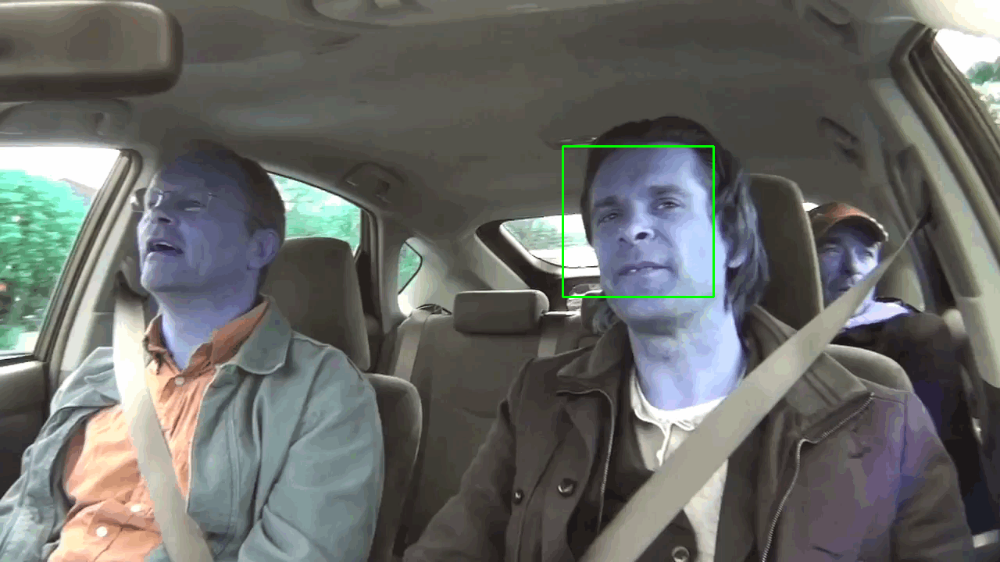

In [ ]:
from IPython.display import Image
Image('./images/faces.gif', format='png')

**Question 2:** Create an image classifier that can identify if a person in the image wears a facial mask (45pt). Evaluate the classifier precision (5pt)

In [ ]:
!pip install turicreate

In [2]:
!mkdir ./datasets
!mkdir ./datasets/masks


mkdir: cannot create directory ‘./datasets’: File exists
mkdir: cannot create directory ‘./datasets/masks’: File exists


In [3]:
!mkdir ./datasets/facemasks
!kaggle datasets download -d ashishjangra27/face-mask-12k-images-dataset -p ./datasets/facemasks
!unzip ./datasets/facemasks/*.zip  -d ./datasets/facemasks/

mkdir: cannot create directory ‘./datasets/facemasks’: File exists
face-mask-12k-images-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/facemasks/face-mask-12k-images-dataset.zip
replace ./datasets/facemasks/Face Mask Dataset/Test/WithMask/1163.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [4]:
train_dir = '/content/datasets/facemasks/Face Mask Dataset/Train'
test_dir = '/content/datasets/facemasks/Face Mask Dataset/Test'
val_dir = '/content/datasets/facemasks/Face Mask Dataset/Validation'

In [5]:
import os
import turicreate as tc
import pandas as pd


In [8]:
tc.__version__

'6.4.1'

In [9]:
train_data = tc.image_analysis.load_images("/content/datasets/facemasks/Face Mask Dataset/Train",with_path=True,
                                                       recursive=True)
train_data["label"]=train_data["path"].apply(lambda x: 1 if "WithMask" in x else 0)
train_data.materialize()


In [10]:
test_data = tc.image_analysis.load_images("/content/datasets/facemasks/Face Mask Dataset/Validation",with_path=True,
                                                       recursive=True)
test_data["label"]=test_data["path"].apply(lambda x: 1 if "WithMask" in x else 0)
test_data.materialize()

In [11]:
model = tc.image_classifier.create(train_data, target='label')

Download completed: /var/tmp/model_cache/resnet-50-TuriCreate-6.0.h5
Performing feature extraction on resized images...
Completed    64/10000
Completed   128/10000
Completed   192/10000
Completed   256/10000
Completed   320/10000
Completed   384/10000
Completed   448/10000
Completed   512/10000
Completed   576/10000
Completed   640/10000
Completed   704/10000
Completed   768/10000
Completed   832/10000
Completed   896/10000
Completed   960/10000
Completed  1024/10000
Completed  1088/10000
Completed  1152/10000
Completed  1216/10000
Completed  1280/10000
Completed  1344/10000
Completed  1408/10000
Completed  1472/10000
Completed  1536/10000
Completed  1600/10000
Completed  1664/10000
Completed  1728/10000
Completed  1792/10000
Completed  1856/10000
Completed  1920/10000
Completed  1984/10000
Completed  2048/10000
Completed  2112/10000
Completed  2176/10000
Completed  2240/10000
Completed  2304/10000
Completed  2368/10000
Completed  2432/10000
Completed  2496/10000
Completed  2560/10000


Logistic regression:

--------------------------------------------------------

Number of examples          : 9500

Number of classes           : 2

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 2049

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 6        | 0.023443  | 3.768017     | 0.569368          | 0.588000            |

| 1         | 10       | 0.492311  | 6.339635     | 0.918632          | 0.916000            |

| 2         | 12       | 0.492311  | 7.950910     | 0.974947          | 0.974000            |

| 3         | 14       | 0.492311  | 9.579024     | 0.987158          | 0.990000            |

| 4         | 16       | 0.492311  | 11.154764    | 0.991684          | 0.988000            |

| 9         | 26       | 0.492311  | 19.179379    | 0.994947          | 0.994000            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

In [12]:
model.evaluate(test_data)

Performing feature extraction on resized images...
Completed  64/800
Completed 128/800
Completed 192/800
Completed 256/800
Completed 320/800
Completed 384/800
Completed 512/800
Completed 576/800
Completed 640/800
Completed 704/800
Completed 768/800
Completed 800/800


{'accuracy': 0.99875, 'auc': 0.9999312499999973, 'confusion_matrix': Columns:
 	target_label	int
 	predicted_label	int
 	count	int
 
 Rows: 3
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |      1       |        1        |  400  |
 |      0       |        1        |   1   |
 |      0       |        0        |  399  |
 +--------------+-----------------+-------+
 [3 rows x 3 columns], 'f1_score': 0.9987515605493134, 'log_loss': 0.026028193589149113, 'precision': 0.9975062344139651, 'recall': 1.0, 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 1001
 
 Data:
 +-----------+--------+-----+-----+-----+
 | threshold |  fpr   | tpr |  p  |  n  |
 +-----------+--------+-----+-----+-----+
 |    0.0    |  1.0   | 1.0 | 400 | 400 |
 |   0.001   | 0.9975 | 1.0 | 400 | 400 |
 |   0.002   | 0.965  | 1.0 | 400 | 400 |
 |   0.003   |  0.91  | 1.0 | 400 | 400 |
 |   0.

In [13]:
from sklearn.metrics import precision_score

In [14]:
test_data['prediction'] = model.predict(test_data)


In [20]:
precision_score(list(test_data["label"]),list(test_data["prediction"]))

0.9975062344139651